In [ ]:
%cd /content/

/content


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/Colab\ Notebooks/MEDAI_DEC/archive.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7294_19890104/TCGA_DU_7294_19890104_9_mask.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_1.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10_mask.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11_mask.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12_mask.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_

In [ ]:
!pip install torchview
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 35.1 MB/s eta 0:00:00


In [ ]:
%cd /content

/content


In [ ]:
cfg_path= "/content/lgg-mri-segmentation/kaggle_3m"

import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torchsummary import summary
from torchview import draw_graph
import torch.optim.lr_scheduler as lr_scheduler
import torch.nn.functional as F
from torch.autograd import Variable

import matplotlib.pyplot as plt
from tqdm import tqdm
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import albumentations as A
from albumentations.pytorch import ToTensorV2
import PIL
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support, accuracy_score, f1_score, matthews_corrcoef
from skimage import io, transform, color
from sklearn.metrics import accuracy_score, precision_score,recall_score,f1_score

import random
from collections import defaultdict
import os
import shutil
import copy
from typing import Dict, List, Tuple
import graphviz
import argparse
from torch.utils.tensorboard import SummaryWriter

# /content/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif

In [ ]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
BATCH_SIZE = (16 if torch.cuda.device_count() < 2
        else (16 * torch.cuda.device_count()))
seed =768
NUM_WORKERS = os.cpu_count()
LR = 1e-3
PATIENCE= 5
EPOCHS=50
NUM_DEVICES = torch.cuda.device_count()



In [ ]:
NUM_WORKERS

2

In [ ]:

NUM_DEVICES

1

In [ ]:
# Fetching files from the directory
file_list= glob.glob(cfg_path+"/*/*.tif", recursive= True)

In [ ]:

len(file_list)

7858

In [ ]:
file_list[:5]

['/content/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7690_19960312/TCGA_HT_7690_19960312_7_mask.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7690_19960312/TCGA_HT_7690_19960312_19.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7690_19960312/TCGA_HT_7690_19960312_9.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7690_19960312/TCGA_HT_7690_19960312_16_mask.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7690_19960312/TCGA_HT_7690_19960312_9_mask.tif']

In [ ]:
# ID sorting for each scan

fl_copy= file_list

In [ ]:
def get_sample_numbers(image_paths):
  sample_numbers= []
  is_mask= []
  for f in image_paths:
    path_list= f.split('/')[-2:][1].split('_')
    print(path_list)

    if 'mask.tif' in path_list:
      sample_numbers.append(int(path_list[-2]))
      is_mask.append(1)
      print(is_mask)
      print(sample_numbers)
    else:
      sample_numbers.append(int(path_list[-1].replace('.tif', '')))
      is_mask.append(0)

  return sample_numbers, is_mask

def get_sample_patient_id(image_paths):
  return [(id_.split('/')[-2:][0]) for id_ in image_paths]



In [ ]:

get_sample_numbers(file_list)

['TCGA', 'HT', '7690', '19960312', '7', 'mask.tif']
[1]
[7]
['TCGA', 'HT', '7690', '19960312', '19.tif']
['TCGA', 'HT', '7690', '19960312', '9.tif']
['TCGA', 'HT', '7690', '19960312', '16', 'mask.tif']
[1, 0, 0, 1]
[7, 19, 9, 16]
['TCGA', 'HT', '7690', '19960312', '9', 'mask.tif']
[1, 0, 0, 1, 1]
[7, 19, 9, 16, 9]
['TCGA', 'HT', '7690', '19960312', '11.tif']
['TCGA', 'HT', '7690', '19960312', '10.tif']
['TCGA', 'HT', '7690', '19960312', '1.tif']
['TCGA', 'HT', '7690', '19960312', '10', 'mask.tif']
[1, 0, 0, 1, 1, 0, 0, 0, 1]
[7, 19, 9, 16, 9, 11, 10, 1, 10]
['TCGA', 'HT', '7690', '19960312', '12.tif']
['TCGA', 'HT', '7690', '19960312', '20.tif']
['TCGA', 'HT', '7690', '19960312', '22.tif']
['TCGA', 'HT', '7690', '19960312', '3.tif']
['TCGA', 'HT', '7690', '19960312', '14.tif']
['TCGA', 'HT', '7690', '19960312', '3', 'mask.tif']
[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1]
[7, 19, 9, 16, 9, 11, 10, 1, 10, 12, 20, 22, 3, 14, 3]
['TCGA', 'HT', '7690', '19960312', '24.tif']
['TCGA', 'HT',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['TCGA', 'FG', '6690', '20020226', '14.tif']
['TCGA', 'FG', '6690', '20020226', '49.tif']
['TCGA', 'FG', '6690', '20020226', '43.tif']
['TCGA', 'FG', '6690', '20020226', '11', 'mask.tif']
[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['TCGA', 'DU', '5854', '19951104', '9.tif']
['TCGA', 'DU', '5854', '19951104', '2', 'mask.tif']
[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



([7,
  19,
  9,
  16,
  9,
  11,
  10,
  1,
  10,
  12,
  20,
  22,
  3,
  14,
  3,
  24,
  17,
  4,
  12,
  15,
  20,
  17,
  24,
  11,
  18,
  6,
  22,
  4,
  23,
  21,
  16,
  7,
  2,
  2,
  8,
  1,
  18,
  21,
  19,
  14,
  6,
  5,
  8,
  23,
  15,
  5,
  13,
  13,
  2,
  10,
  9,
  29,
  2,
  17,
  29,
  11,
  4,
  25,
  31,
  14,
  13,
  18,
  27,
  26,
  23,
  4,
  28,
  27,
  13,
  28,
  8,
  16,
  31,
  30,
  6,
  5,
  1,
  20,
  21,
  7,
  5,
  16,
  12,
  22,
  25,
  24,
  15,
  11,
  23,
  32,
  14,
  26,
  24,
  17,
  19,
  18,
  7,
  8,
  21,
  20,
  3,
  30,
  9,
  12,
  19,
  32,
  22,
  15,
  6,
  3,
  10,
  1,
  21,
  16,
  9,
  15,
  3,
  2,
  5,
  30,
  13,
  15,
  4,
  4,
  11,
  35,
  11,
  28,
  38,
  8,
  16,
  6,
  22,
  31,
  35,
  7,
  3,
  1,
  19,
  8,
  29,
  20,
  12,
  17,
  25,
  33,
  27,
  26,
  1,
  25,
  18,
  14,
  28,
  22,
  32,
  9,
  10,
  19,
  24,
  10,
  20,
  26,
  24,
  7,
  32,
  37,
  31,
  17,
  18,
  14,
  29,
  23,
  30,
  6,
  34,
  

In [ ]:
get_sample_patient_id(file_list)

['TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_7690_19960312',
 'TCGA_HT_76

In [ ]:

def build_df(image_paths):
  sample_numbers, mask_label= get_sample_numbers(image_paths)
  sample_df= pd.DataFrame({
      'id': sample_numbers ,
      'patient': get_sample_patient_id(image_paths),
      'image_path': image_paths,
      'is_mask': mask_label,

  })
  return sample_df

In [ ]:

dataset_df=(build_df(file_list).sort_values(by= ['id', 'patient', 'image_path']).reset_index(drop= True))

['TCGA', 'HT', '7690', '19960312', '7', 'mask.tif']
[1]
[7]
['TCGA', 'HT', '7690', '19960312', '19.tif']
['TCGA', 'HT', '7690', '19960312', '9.tif']
['TCGA', 'HT', '7690', '19960312', '16', 'mask.tif']
[1, 0, 0, 1]
[7, 19, 9, 16]
['TCGA', 'HT', '7690', '19960312', '9', 'mask.tif']
[1, 0, 0, 1, 1]
[7, 19, 9, 16, 9]
['TCGA', 'HT', '7690', '19960312', '11.tif']
['TCGA', 'HT', '7690', '19960312', '10.tif']
['TCGA', 'HT', '7690', '19960312', '1.tif']
['TCGA', 'HT', '7690', '19960312', '10', 'mask.tif']
[1, 0, 0, 1, 1, 0, 0, 0, 1]
[7, 19, 9, 16, 9, 11, 10, 1, 10]
['TCGA', 'HT', '7690', '19960312', '12.tif']
['TCGA', 'HT', '7690', '19960312', '20.tif']
['TCGA', 'HT', '7690', '19960312', '22.tif']
['TCGA', 'HT', '7690', '19960312', '3.tif']
['TCGA', 'HT', '7690', '19960312', '14.tif']
['TCGA', 'HT', '7690', '19960312', '3', 'mask.tif']
[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1]
[7, 19, 9, 16, 9, 11, 10, 1, 10, 12, 20, 22, 3, 14, 3]
['TCGA', 'HT', '7690', '19960312', '24.tif']
['TCGA', 'HT',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['TCGA', 'HT', '7881', '19981015', '22.tif']
['TCGA', 'HT', '7881', '19981015', '14.tif']
['TCGA', 'HT', '7881', '19981015', '54.tif']
['TCGA', 'HT', '7881', '19981015', '28', 'mask.tif']
[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[7, 19, 9, 16, 9, 11, 10, 1, 10, 12, 20, 22, 3, 14, 3, 24, 17, 4, 12, 15, 20, 17, 24, 11, 18, 6, 22, 4, 23, 21, 16, 7, 2, 2, 8, 1, 18, 21, 19, 14, 6, 5, 8, 23, 15, 5, 13, 13, 2, 10, 9, 29, 2, 17, 29, 11, 4, 25, 31, 14, 13, 18, 27, 26, 23, 4, 28, 27, 13, 28, 8, 16, 31, 30, 6, 5, 1, 20, 21, 7, 5, 16, 12, 22, 25, 24, 15, 11, 23, 32, 14, 26, 24, 17, 19, 18, 7, 8, 21, 20, 3, 30, 9, 12, 19, 32, 22, 15, 6, 3, 10, 1, 21, 16, 9, 15, 3, 2, 5, 30, 13, 15, 4, 4, 11, 35, 11, 28, 38, 8, 16, 6, 22, 31, 35, 7, 3, 1, 19, 8, 29, 20, 12, 17, 25, 33, 27, 26, 1, 25, 18, 14, 28, 22, 32, 9, 10, 19, 24, 10, 20, 26, 24, 7, 32, 37, 31, 17, 18, 14, 29, 23, 30, 6, 34, 21, 2, 12, 33, 37, 38, 27, 23, 13, 34, 5, 36, 36, 25, 10, 29, 21, 28, 21, 6, 1, 22, 32, 31, 24, 5, 3, 15, 19, 24, 18, 20, 16, 4, 9, 2, 2, 17, 16, 11, 28, 18, 26, 15, 7, 31, 25, 20, 3, 7, 19, 12, 14, 22, 11, 12, 6, 8, 30, 10, 23, 30, 32, 13, 8, 13, 29, 27, 23, 14, 1, 27, 4, 5, 9, 17, 26, 18, 30, 2, 20, 10, 14, 30, 45, 42, 3, 9, 32, 36, 31, 7, 22, 26,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['TCGA', 'DU', '7300', '19910814', '2', 'mask.tif']
[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
dataset_df.head()

,id,patient,image_path,is_mask
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
1,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1
2,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
3,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1
4,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0


In [ ]:
#Group Samples by mask status

grouped_df= dataset_df.groupby(by= 'is_mask')
image_df = grouped_df.get_group(0).drop('is_mask', axis=1).reset_index(drop=True)
mask_df = grouped_df.get_group(1).drop('is_mask', axis=1).reset_index(drop=True)

In [ ]:

mask_df= mask_df.rename({'image_path' : 'mask_path'}, axis=1)

In [ ]:
mask_df

,id,patient,mask_path
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
1,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
2,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
3,1,TCGA_CS_4944_20010208,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
4,1,TCGA_CS_5393_19990606,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
...,...,...,...
3924,86,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3925,87,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3926,87,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3927,88,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...


In [ ]:
def _load(image_path, as_tensor= True):
  image=Image.open(image_path)
  image= np.array(image).astype(np.float32) / 255.
  return image

def generate_label(mask_path, load_fn):
  mask= load_fn(mask_path)
  if mask.max() > 0:
    return 1
  return 0

In [ ]:
ds= image_df.merge(mask_df, on=['id', 'patient'], how='left')



In [ ]:
ds

,id,patient,image_path,mask_path
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
1,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
2,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
3,1,TCGA_CS_4944_20010208,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
4,1,TCGA_CS_5393_19990606,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
...,...,...,...,...
3924,86,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3925,87,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3926,87,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3927,88,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...


In [ ]:
ds['diagnosis'] = [generate_label(_, _load) for _ in tqdm(ds['mask_path'])]

100%|██████████| 3929/3929 [00:05<00:00, 732.42it/s]


In [ ]:
ds

,id,patient,image_path,mask_path,diagnosis
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
1,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
2,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
3,1,TCGA_CS_4944_20010208,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
4,1,TCGA_CS_5393_19990606,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
...,...,...,...,...,...
3924,86,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3925,87,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3926,87,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3927,88,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0


<ipython-input-28-2968cc3ca7e2>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  bar_plot= sns.barplot(
<ipython-input-28-2968cc3ca7e2>:10: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  bar_plot= sns.barplot(


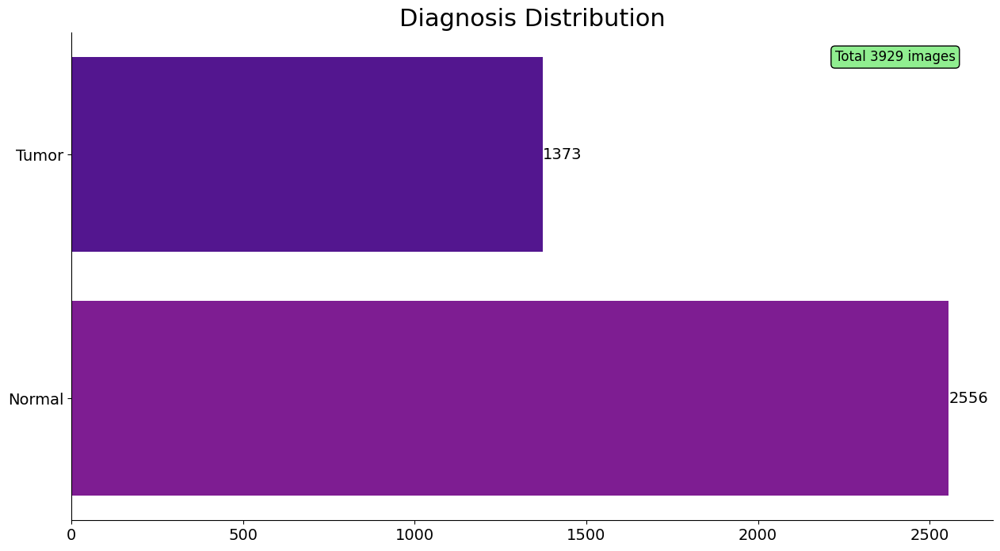

In [ ]:
# To View Diagnosis Distribution

fig= plt.figure(figsize= (15,8))

plt.title("Diagnosis Distribution", fontsize= 22)

diagnosis_distribution =ds['diagnosis'].value_counts().sort_values()
diagnosis_map = {0 : 'Normal', 1 : 'Tumor'}

bar_plot= sns.barplot(
    x= diagnosis_distribution.values,
    y= [diagnosis_map[_] for _ in diagnosis_distribution.keys()],
    palette= sns.color_palette("plasma"),
    orient= 'h'
)

for container in bar_plot.containers:
  bar_plot.bar_label(container, fmt= '%.0f', fontsize= 14)

plt.xticks(fontsize= 14)
plt.yticks(fontsize= 14)

text_params= {
    'x' : 2400,
    'y' : -0.4,
    's' : f"Total {len(ds)} images",
    'size' : 12,
    'color' : "Black",
    'ha'    : "center",
    'va'    : "center",
    'bbox'  : dict(boxstyle= "round", fc= ("lightgreen"), ec= ("black"))

}
plt.text(**text_params)

sns.despine()




diagnosi_map= [_ for _ in diagnosis_distribution.keys()]


In [ ]:
def view_sample(image, mask, color_map= 'rgb', fig_size= (16,8), title_size= 18):
  plt.figure(figsize= fig_size);
  plt.tight_layout();
  plt.subplots_adjust(top= 0.95);

  plt.subplot(1,3, 1);
  plt.title("MRI", fontsize= title_size);
  if color_map == "rgb":
    plt.imshow(image);
  else:
    plt.imshow(image, cmap= color_map);

  plt.subplot(1, 3, 2);
  plt.title("Mask", fontsize= title_size);
  plt.imshow(mask, cmap= "gray");

  plt.subplot(1, 3, 3);
  plt.title("MRI + Mask", fontsize= title_size);

  if color_map == "rgb":
    plt.imshow(image)
  else:
    plt.imshow(image, cmap= color_map)

  plt.imshow(mask, cmap="gray", alpha= 0.5);

  return








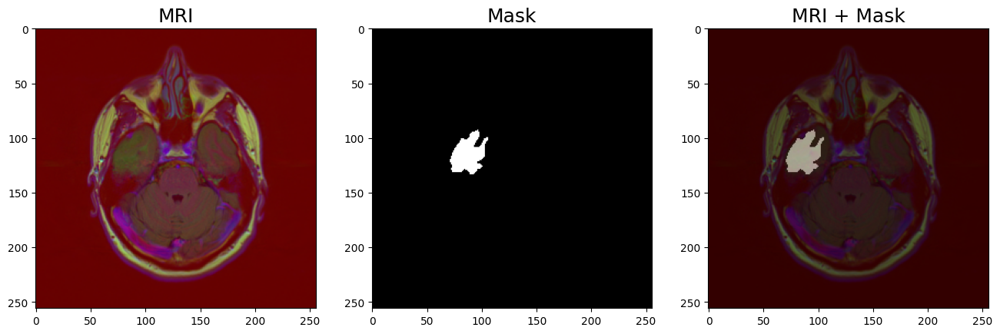

In [ ]:
rd_num= random.sample(ds.index.to_list(), 1)[0]
sample_image, sample_mask= _load(ds.image_path[rd_num]),  _load(ds.mask_path[rd_num])
view_sample(sample_image, sample_mask, color_map= 'mako')

In [ ]:
def view_multiple_sample(df, sample_loader, count= 10, color_map= "rgb", fig_size= (14, 10) ,title_size= 18):

  rd_num= random.sample(df.index.to_list(), count)
  plt.figure(figsize= fig_size);
  plt.tight_layout();
  plt.subplots_adjust(top= 0.95)

  for x, y in enumerate(rd_num):
    image, mask= (sample_loader(df.image_path[y]),sample_loader(df.mask_path[y]))

    idx= 3 * (x+1)
    plt.subplot(count+1, 3, idx+1);
    plt.title("MRI", fontsize= title_size);
    if color_map== "rgb":
      plt.imshow(image);
    else:
      plt.imshow(image, cmap= color_map);

    plt.subplot(count+1, 3, idx+2);
    plt.title("Mask", fontsize= title_size);
    plt.imshow(mask, cmap= "gray")

    plt.subplot(count+1, 3, idx+3)
    plt.title("MRI + MASK", fontsize= title_size)
    if color_map== "rgb":
      plt.imshow(image)
    else:
      plt.imshow(image, cmap= color_map)
    plt.imshow(mask, cmap ="gray", alpha= 0.5)

  return




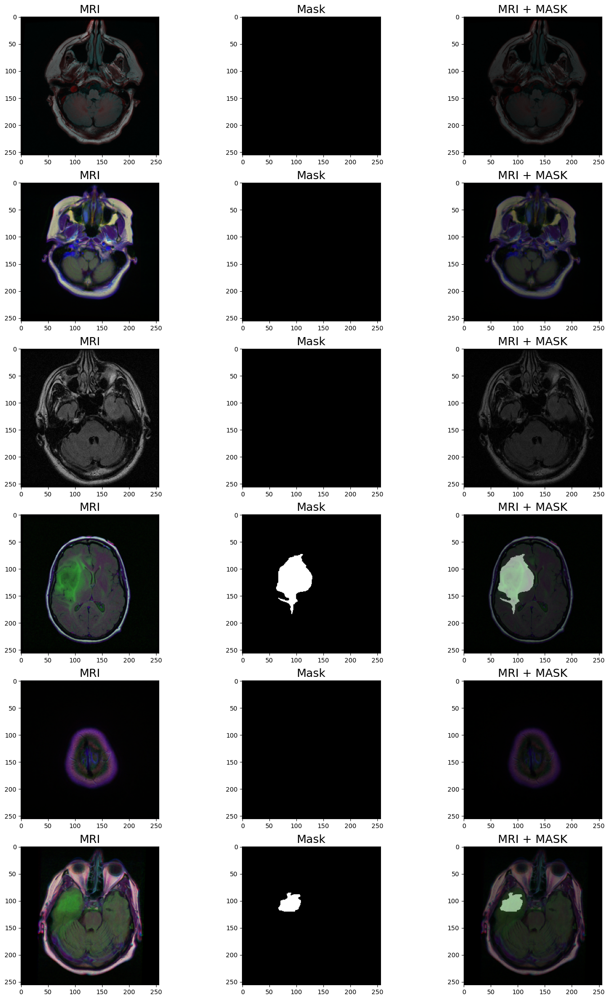

In [ ]:
view_multiple_sample(ds, _load, count=6, color_map = "mako", fig_size= (18, 30)  )


In [ ]:
#Augment train data
train_transforms= A.Compose([
    # A.RandomCrop(120, 120, p= 0.5),
    A.Resize(224, 224, p=1.0),
    A.RandomBrightnessContrast(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    ToTensorV2(),
])

# Reshape Inference data
inference_transforms= A.Compose([
    A.Resize(224, 224, p=1.0),
    ToTensorV2(),
])


In [ ]:
# class Glioma_dataloader(Dataset):
#   def __init__(self, img_name_list, lbl_name_list, transform=None):
#     self.image_name_list = img_name_list

#     self.label_name_list = lbl_name_list
#     self.transform = transform

#   def __len__(self):
#     return len(self.image_name_list)

#   def __getitem__(self, idx):
#     image = io.imread(self.image_name_list[idx],  plugin='pil')
#     imname = self.image_name_list[idx]
#     imidx = np.array([idx])
#     label = io.imread(self.label_name_list[idx],  plugin='pil')
#     sample= {'imidx': imidx, 'image': image, 'label': label}

#     if self.transform:
#       transformed= self.transform(image= image, label= label)
#       sample = {'imidx': imidx, 'image': transformed['image'], 'label': transformed['label']}
#     return sample

In [ ]:
class MRISegmentationDataset(Dataset):
  def __init__(self, df:pd.DataFrame, transform= None) -> None:
    super().__init__()

    self.mri_paths= df['image_path'].to_list()
    self.mask_paths= df['mask_path'].to_list()

    self.transform= transform

  def load_sample(self, index:str) -> Image.Image:
    image_path= self.mri_paths[index]
    mask_path= self.mask_paths[index]

    image= Image.open(image_path)
    mask= Image.open(mask_path)

    image= np.array(image).astype(np.float32) /255.
    mask= np.array(mask).astype(np.float32) /255.


    return image, mask

  def __len__(self) -> int:
    return self.mri_paths.__len__()

  def __getitem__(self, index:int) -> Tuple[torch.Tensor, torch.Tensor]:
    image,mask = self.load_sample(index)

    if self.transform:
      transformed= self.transform(image= image, mask= mask)
      return transformed['image'], transformed['mask'].unsqueeze_(0)
    else:
      transformed= ToTensorV2()(image= image, mask=mask)
      return transformed['image'], transformed['mask'].unsqueeze_(0)








In [ ]:
class BCEDiceLoss(nn.Module):
  def __init__(self):
    super().__init__()

  def forward(self, input, target):
    bce = F.binary_cross_entropy_with_logits(input, target)
    smooth = 1e-5
    input = torch.sigmoid(input)
    # input = torch.tanh(input)
    num = target.size(0)
    input = input.view(num, -1)
    target = target.view(num, -1)
    intersection = (input * target)
    dice = (2. * intersection.sum(1) + smooth) / (input.sum(1) + target.sum(1) + smooth)
    dice = 1 - dice.sum() / num
    return 0.5 * bce + dice


class GliomaNetLoss(nn.Module):
  def __init__(self):
    super(GliomaNetLoss, self).__init__()
    self.loss = BCEDiceLoss()

  def forward(self, d0, labels_v):
    loss0 = self.loss(d0, labels_v)
    # loss1 = self.loss(d1, labels_v)
    # loss2 = self.loss(d2, labels_v)
    # loss3 = self.loss(d3, labels_v)
    # loss4 = self.loss(d4, labels_v)
    # loss5 = self.loss(d5, labels_v)
    # loss6 = self.loss(d6, labels_v)
    # loss = loss0 + loss1 + loss2 + loss3
    print("l0: %3f\n" % (
        loss0.data))
    return loss0

In [ ]:
import os.path
import warnings

import torch
from torch import nn
import torch.nn.functional as F


class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=16):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.fc1 = nn.Conv2d(in_planes, in_planes // 16, 1, bias=False)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Conv2d(in_planes // 16, in_planes, 1, bias=False)

        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc2(self.relu1(self.fc1(self.avg_pool(x))))
        max_out = self.fc2(self.relu1(self.fc1(self.max_pool(x))))
        out = avg_out + max_out
        return self.sigmoid(out)


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()

        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)


class BasicConv2d(nn.Module):
    def __init__(self, in_planes, out_planes, kernel_size, stride=1, padding=0, dilation=1):
        super(BasicConv2d, self).__init__()

        self.conv = nn.Conv2d(in_planes, out_planes,
                              kernel_size=kernel_size, stride=stride,
                              padding=padding, dilation=dilation, bias=False)
        self.bn = nn.BatchNorm2d(out_planes)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return x


class Encoder(nn.Module):
    def __init__(self, pretrain_path):
        super().__init__()
        self.backbone = pvt_v2_b2()

        if pretrain_path is None:
            warnings.warn('please provide the pretrained pvt model. Not using pretrained model.')
        elif not os.path.isfile(pretrain_path):
            warnings.warn(f'path: {pretrain_path} does not exists. Not using pretrained model.')
        else:
            print(f"using pretrained file: {pretrain_path}")
            save_model = torch.load(pretrain_path)
            model_dict = self.backbone.state_dict()
            state_dict = {k: v for k, v in save_model.items() if k in model_dict.keys()}
            model_dict.update(state_dict)

            self.backbone.load_state_dict(model_dict)

    def forward(self, x):
        f1, f2, f3, f4 = self.backbone(x)  # (x: 3, 352, 352)
        return f1, f2, f3, f4

class SDI(nn.Module):
    def __init__(self, channel):
        super().__init__()

        self.convs = nn.ModuleList(
            [nn.Conv2d(channel, channel, kernel_size=3, stride=1, padding=1) for _ in range(4)])

    def forward(self, xs, anchor):
        ans = torch.ones_like(anchor)
        target_size = anchor.shape[-1]

        for i, x in enumerate(xs):
            if x.shape[-1] > target_size:
                x = F.adaptive_avg_pool2d(x, (target_size, target_size))
            elif x.shape[-1] < target_size:
                x = F.interpolate(x, size=(target_size, target_size),
                                      mode='bilinear', align_corners=True)

            ans = ans * self.convs[i](x)

        return ans


class UNetV2(nn.Module):
    """
    use SpatialAtt + ChannelAtt
    """
    def __init__(self, channel=32, n_classes=1, pretrained_path=None):
        super().__init__()


        self.encoder = Encoder(pretrained_path)

        self.ca_1 = ChannelAttention(64)
        self.sa_1 = SpatialAttention()

        self.ca_2 = ChannelAttention(128)
        self.sa_2 = SpatialAttention()

        self.ca_3 = ChannelAttention(320)
        self.sa_3 = SpatialAttention()

        self.ca_4 = ChannelAttention(512)
        self.sa_4 = SpatialAttention()

        self.Translayer_1 = BasicConv2d(64, channel, 1)
        self.Translayer_2 = BasicConv2d(128, channel, 1)
        self.Translayer_3 = BasicConv2d(320, channel, 1)
        self.Translayer_4 = BasicConv2d(512, channel, 1)

        self.sdi_1 = SDI(channel)
        self.sdi_2 = SDI(channel)
        self.sdi_3 = SDI(channel)
        self.sdi_4 = SDI(channel)

        self.seg_outs = nn.ModuleList([
            nn.Conv2d(channel, n_classes, 1, 1) for _ in range(4)])

        self.deconv2 = nn.ConvTranspose2d(channel, channel, kernel_size=4, stride=2, padding=1,
                                          bias=False)
        self.deconv3 = nn.ConvTranspose2d(channel, channel, kernel_size=4, stride=2,
                                          padding=1, bias=False)
        self.deconv4 = nn.ConvTranspose2d(channel, channel, kernel_size=4, stride=2,
                                          padding=1, bias=False)
        self.deconv5 = nn.ConvTranspose2d(channel, channel, kernel_size=4, stride=2,
                                          padding=1, bias=False)

    def forward(self, x):
        seg_outs = []
        f1, f2, f3, f4 = self.encoder(x)

        f1 = self.ca_1(f1) * f1
        f1 = self.sa_1(f1) * f1
        f1 = self.Translayer_1(f1)

        f2 = self.ca_2(f2) * f2
        f2 = self.sa_2(f2) * f2
        f2 = self.Translayer_2(f2)

        f3 = self.ca_3(f3) * f3
        f3 = self.sa_3(f3) * f3
        f3 = self.Translayer_3(f3)

        f4 = self.ca_4(f4) * f4
        f4 = self.sa_4(f4) * f4
        f4 = self.Translayer_4(f4)

        f41 = self.sdi_4([f1, f2, f3, f4], f4)
        f31 = self.sdi_3([f1, f2, f3, f4], f3)
        f21 = self.sdi_2([f1, f2, f3, f4], f2)
        f11 = self.sdi_1([f1, f2, f3, f4], f1)

        seg_outs.append(self.seg_outs[0](f41))

        y = self.deconv2(f41) + f31
        seg_outs.append(self.seg_outs[1](y))

        y = self.deconv3(y) + f21
        seg_outs.append(self.seg_outs[2](y))

        y = self.deconv4(y) + f11
        seg_outs.append(self.seg_outs[3](y))

        for i, o in enumerate(seg_outs):
            seg_outs[i] = F.interpolate(o, scale_factor=4, mode='bilinear')

        # if self.deep_supervision:
        #     return seg_outs[::-1]
        # else:
        return seg_outs[-1]

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from functools import partial

from timm.models.layers import DropPath, to_2tuple, trunc_normal_
from timm.models.registry import register_model
from timm.models.vision_transformer import _cfg
from timm.models.registry import register_model

import math


class Mlp(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act_layer=nn.GELU, drop=0.):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.dwconv = DWConv(hidden_features)
        self.act = act_layer()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x, H, W):
        x = self.fc1(x)
        x = self.dwconv(x, H, W)
        x = self.act(x)
        x = self.drop(x)
        x = self.fc2(x)
        x = self.drop(x)
        return x


class Attention(nn.Module):
    def __init__(self, dim, num_heads=8, qkv_bias=False, qk_scale=None, attn_drop=0., proj_drop=0., sr_ratio=1):
        super().__init__()
        assert dim % num_heads == 0, f"dim {dim} should be divided by num_heads {num_heads}."

        self.dim = dim
        self.num_heads = num_heads
        head_dim = dim // num_heads
        self.scale = qk_scale or head_dim ** -0.5

        self.q = nn.Linear(dim, dim, bias=qkv_bias)
        self.kv = nn.Linear(dim, dim * 2, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(proj_drop)

        self.sr_ratio = sr_ratio
        if sr_ratio > 1:
            self.sr = nn.Conv2d(dim, dim, kernel_size=sr_ratio, stride=sr_ratio)
            self.norm = nn.LayerNorm(dim)

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x, H, W):
        B, N, C = x.shape
        q = self.q(x).reshape(B, N, self.num_heads, C // self.num_heads).permute(0, 2, 1, 3)

        if self.sr_ratio > 1:
            x_ = x.permute(0, 2, 1).reshape(B, C, H, W)
            x_ = self.sr(x_).reshape(B, C, -1).permute(0, 2, 1)
            x_ = self.norm(x_)
            kv = self.kv(x_).reshape(B, -1, 2, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
        else:
            kv = self.kv(x).reshape(B, -1, 2, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
        k, v = kv[0], kv[1]

        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)
        attn = self.attn_drop(attn)

        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)

        return x


class Block(nn.Module):

    def __init__(self, dim, num_heads, mlp_ratio=4., qkv_bias=False, qk_scale=None, drop=0., attn_drop=0.,
                 drop_path=0., act_layer=nn.GELU, norm_layer=nn.LayerNorm, sr_ratio=1):
        super().__init__()
        self.norm1 = norm_layer(dim)
        self.attn = Attention(
            dim,
            num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale,
            attn_drop=attn_drop, proj_drop=drop, sr_ratio=sr_ratio)
        # NOTE: drop path for stochastic depth, we shall see if this is better than dropout here
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.norm2 = norm_layer(dim)
        mlp_hidden_dim = int(dim * mlp_ratio)
        self.mlp = Mlp(in_features=dim, hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x, H, W):
        x = x + self.drop_path(self.attn(self.norm1(x), H, W))
        x = x + self.drop_path(self.mlp(self.norm2(x), H, W))

        return x


class OverlapPatchEmbed(nn.Module):
    """ Image to Patch Embedding
    """

    def __init__(self, img_size=224, patch_size=7, stride=4, in_chans=3, embed_dim=768):
        super().__init__()
        img_size = to_2tuple(img_size)
        patch_size = to_2tuple(patch_size)

        self.img_size = img_size
        self.patch_size = patch_size
        self.H, self.W = img_size[0] // patch_size[0], img_size[1] // patch_size[1]
        self.num_patches = self.H * self.W
        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=stride,
                              padding=(patch_size[0] // 2, patch_size[1] // 2))
        self.norm = nn.LayerNorm(embed_dim)

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x):
        x = self.proj(x)
        _, _, H, W = x.shape
        x = x.flatten(2).transpose(1, 2)
        x = self.norm(x)

        return x, H, W


class PyramidVisionTransformerImpr(nn.Module):
    def __init__(self, img_size=224, patch_size=16, in_chans=3, num_classes=1, embed_dims=[64, 128, 256, 512],
                 num_heads=[1, 2, 4, 8], mlp_ratios=[4, 4, 4, 4], qkv_bias=False, qk_scale=None, drop_rate=0.,
                 attn_drop_rate=0., drop_path_rate=0., norm_layer=nn.LayerNorm,
                 depths=[3, 4, 6, 3], sr_ratios=[8, 4, 2, 1]):
        super().__init__()
        self.num_classes = num_classes
        self.depths = depths

        # patch_embed
        self.patch_embed1 = OverlapPatchEmbed(img_size=img_size, patch_size=7, stride=4, in_chans=in_chans,
                                              embed_dim=embed_dims[0])
        self.patch_embed2 = OverlapPatchEmbed(img_size=img_size // 4, patch_size=3, stride=2, in_chans=embed_dims[0],
                                              embed_dim=embed_dims[1])
        self.patch_embed3 = OverlapPatchEmbed(img_size=img_size // 8, patch_size=3, stride=2, in_chans=embed_dims[1],
                                              embed_dim=embed_dims[2])
        self.patch_embed4 = OverlapPatchEmbed(img_size=img_size // 16, patch_size=3, stride=2, in_chans=embed_dims[2],
                                              embed_dim=embed_dims[3])

        # transformer encoder
        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, sum(depths))]  # stochastic depth decay rule
        cur = 0
        self.block1 = nn.ModuleList([Block(
            dim=embed_dims[0], num_heads=num_heads[0], mlp_ratio=mlp_ratios[0], qkv_bias=qkv_bias, qk_scale=qk_scale,
            drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[cur + i], norm_layer=norm_layer,
            sr_ratio=sr_ratios[0])
            for i in range(depths[0])])
        self.norm1 = norm_layer(embed_dims[0])

        cur += depths[0]
        self.block2 = nn.ModuleList([Block(
            dim=embed_dims[1], num_heads=num_heads[1], mlp_ratio=mlp_ratios[1], qkv_bias=qkv_bias, qk_scale=qk_scale,
            drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[cur + i], norm_layer=norm_layer,
            sr_ratio=sr_ratios[1])
            for i in range(depths[1])])
        self.norm2 = norm_layer(embed_dims[1])

        cur += depths[1]
        self.block3 = nn.ModuleList([Block(
            dim=embed_dims[2], num_heads=num_heads[2], mlp_ratio=mlp_ratios[2], qkv_bias=qkv_bias, qk_scale=qk_scale,
            drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[cur + i], norm_layer=norm_layer,
            sr_ratio=sr_ratios[2])
            for i in range(depths[2])])
        self.norm3 = norm_layer(embed_dims[2])

        cur += depths[2]
        self.block4 = nn.ModuleList([Block(
            dim=embed_dims[3], num_heads=num_heads[3], mlp_ratio=mlp_ratios[3], qkv_bias=qkv_bias, qk_scale=qk_scale,
            drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[cur + i], norm_layer=norm_layer,
            sr_ratio=sr_ratios[3])
            for i in range(depths[3])])
        self.norm4 = norm_layer(embed_dims[3])

        # classification head
        # self.head = nn.Linear(embed_dims[3], num_classes) if num_classes > 0 else nn.Identity()

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()

    def init_weights(self, pretrained=None):
        if isinstance(pretrained, str):
            logger = 1
            #load_checkpoint(self, pretrained, map_location='cpu', strict=False, logger=logger)

    def reset_drop_path(self, drop_path_rate):
        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, sum(self.depths))]
        cur = 0
        for i in range(self.depths[0]):
            self.block1[i].drop_path.drop_prob = dpr[cur + i]

        cur += self.depths[0]
        for i in range(self.depths[1]):
            self.block2[i].drop_path.drop_prob = dpr[cur + i]

        cur += self.depths[1]
        for i in range(self.depths[2]):
            self.block3[i].drop_path.drop_prob = dpr[cur + i]

        cur += self.depths[2]
        for i in range(self.depths[3]):
            self.block4[i].drop_path.drop_prob = dpr[cur + i]

    def freeze_patch_emb(self):
        self.patch_embed1.requires_grad = False

    @torch.jit.ignore
    def no_weight_decay(self):
        return {'pos_embed1', 'pos_embed2', 'pos_embed3', 'pos_embed4', 'cls_token'}  # has pos_embed may be better

    def get_classifier(self):
        return self.head

    def reset_classifier(self, num_classes, global_pool=''):
        self.num_classes = num_classes
        self.head = nn.Linear(self.embed_dim, num_classes) if num_classes > 0 else nn.Identity()

    # def _get_pos_embed(self, pos_embed, patch_embed, H, W):
    #     if H * W == self.patch_embed1.num_patches:
    #         return pos_embed
    #     else:
    #         return F.interpolate(
    #             pos_embed.reshape(1, patch_embed.H, patch_embed.W, -1).permute(0, 3, 1, 2),
    #             size=(H, W), mode="bilinear").reshape(1, -1, H * W).permute(0, 2, 1)

    def forward_features(self, x):
        B = x.shape[0]
        outs = []

        # stage 1
        x, H, W = self.patch_embed1(x)
        for i, blk in enumerate(self.block1):
            x = blk(x, H, W)
        x = self.norm1(x)
        x = x.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()
        outs.append(x)

        # stage 2
        x, H, W = self.patch_embed2(x)
        for i, blk in enumerate(self.block2):
            x = blk(x, H, W)
        x = self.norm2(x)
        x = x.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()
        outs.append(x)

        # stage 3
        x, H, W = self.patch_embed3(x)
        for i, blk in enumerate(self.block3):
            x = blk(x, H, W)
        x = self.norm3(x)
        x = x.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()
        outs.append(x)

        # stage 4
        x, H, W = self.patch_embed4(x)
        for i, blk in enumerate(self.block4):
            x = blk(x, H, W)
        x = self.norm4(x)
        x = x.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()
        outs.append(x)

        return outs

        # return x.mean(dim=1)

    def forward(self, x):
        x = self.forward_features(x)
        # x = self.head(x)

        return x


class DWConv(nn.Module):
    def __init__(self, dim=768):
        super(DWConv, self).__init__()
        self.dwconv = nn.Conv2d(dim, dim, 3, 1, 1, bias=True, groups=dim)

    def forward(self, x, H, W):
        B, N, C = x.shape
        x = x.transpose(1, 2).view(B, C, H, W)
        x = self.dwconv(x)
        x = x.flatten(2).transpose(1, 2)

        return x


def _conv_filter(state_dict, patch_size=16):
    """ convert patch embedding weight from manual patchify + linear proj to conv"""
    out_dict = {}
    for k, v in state_dict.items():
        if 'patch_embed.proj.weight' in k:
            v = v.reshape((v.shape[0], 3, patch_size, patch_size))
        out_dict[k] = v

    return out_dict

@register_model
class pvt_v2_b2(PyramidVisionTransformerImpr):
    def __init__(self, **kwargs):
        super(pvt_v2_b2, self).__init__(
            patch_size=16, embed_dims=[64, 128, 320, 512], num_heads=[1, 2, 5, 8], mlp_ratios=[8, 8, 4, 4],
            qkv_bias=True, norm_layer=partial(nn.LayerNorm, eps=1e-6), depths=[3, 4, 6, 3], sr_ratios=[8, 4, 2, 1],
            drop_rate=0.0, drop_path_rate=0.1)

<ipython-input-38-c5ceacfbcb74>:387: UserWarning: Overwriting pvt_v2_b2 in registry with __main__.pvt_v2_b2. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  class pvt_v2_b2(PyramidVisionTransformerImpr):


In [ ]:
pretrained_path = "/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/pvt_v2_b2.pth"

net= UNetV2(channel= 256, n_classes=1, pretrained_path= pretrained_path).to(DEVICE)
x = torch.rand((1, 3, 224, 224)).cuda()
inputs= net(x)
print(inputs)

using pretrained file: /content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/pvt_v2_b2.pth
tensor([[[[-0.2172, -0.2172, -0.1801,  ..., -0.0189, -0.0469, -0.0469],
          [-0.2172, -0.2172, -0.1801,  ..., -0.0189, -0.0469, -0.0469],
          [-0.2351, -0.2351, -0.2098,  ..., -0.0051, -0.0278, -0.0278],
          ...,
          [-0.0405, -0.0405, -0.0375,  ..., -0.2230, -0.1423, -0.1423],
          [-0.0598, -0.0598, -0.0471,  ..., -0.4149, -0.3852, -0.3852],
          [-0.0598, -0.0598, -0.0471,  ..., -0.4149, -0.3852, -0.3852]]]],
       device='cuda:0', grad_fn=<UpsampleBilinear2DBackward0>)


In [ ]:
print(net)

UNetV2(
  (encoder): Encoder(
    (backbone): pvt_v2_b2(
      (patch_embed1): OverlapPatchEmbed(
        (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
        (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
      )
      (patch_embed2): OverlapPatchEmbed(
        (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (patch_embed3): OverlapPatchEmbed(
        (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
      )
      (patch_embed4): OverlapPatchEmbed(
        (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      )
      (block1): ModuleList(
        (0): Block(
          (norm1): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
          (attn)

In [ ]:
pytorch_total_params = sum(p.numel() for p in net.parameters())
print(f"Model Parameters:\t {pytorch_total_params:,}")

Model Parameters:	 38,799,180


In [ ]:
# Splitting the dataset for training
train_split_idx, data_split_idx, _, _= train_test_split(ds.index, ds.diagnosis, test_size= 0.30, stratify= ds.diagnosis, random_state= seed)

In [ ]:
train_df= ds.iloc[train_split_idx].reset_index(drop=True)
data_df= ds.iloc[data_split_idx].reset_index(drop=True)

In [ ]:
print(train_df.shape)
print(data_df.shape)

(2750, 5)
(1179, 5)


In [ ]:
val_split_idx, test_split_idx, _, _ = train_test_split(data_df.index, data_df.diagnosis, test_size= 0.65, stratify = data_df.diagnosis, random_state= seed )

In [ ]:
val_df= data_df.iloc[val_split_idx].reset_index(drop= True)
test_df= data_df.iloc[test_split_idx].reset_index(drop= True)

In [ ]:
print(val_df.shape)
print(test_df.shape)

(412, 5)
(767, 5)


In [ ]:
train_size= len(train_df)
test_size= len(test_df)
val_size= len(val_df)
total_size= train_size + test_size + val_size

print("===================================================")
print(f'Training Sample Size:\t\t{train_size}\t({(100 * train_size/total_size):.2f}%)')
print(f'Testing Sample Size:\t\t{test_size}\t({(100 * test_size/total_size):.2f}%)')
print(f'Validation Sample Size:\t\t{val_size}\t({(100 * val_size/total_size):.2f}%)')
print("===================================================")

print(f'Total \t\t\t\t{total_size}\t({(100 * total_size/total_size):.2f}%)')


Training Sample Size:		2750	(69.99%)
Testing Sample Size:		767	(19.52%)
Validation Sample Size:		412	(10.49%)
Total 				3929	(100.00%)


In [ ]:
tra_img_name_list= train_df['image_path'].to_list()
tra_lbl_name_list= train_df['mask_path'].to_list()

In [ ]:
tra_lbl_name_list[0]

'/content/lgg-mri-segmentation/kaggle_3m/TCGA_FG_5962_20000626/TCGA_FG_5962_20000626_12_mask.tif'

In [ ]:
kwargs= {
    'name' : 'GliomaNet',
    'epochs' : 100,
    'batch_size': 50,
    'channel': 256,
    'num_classes' : 1,
    'data_folder_name': 'train_data',
    'optimizer': 'AdamW',
    'lr': 1e-4,
    'nesterov': False,
    'momentum': 0.9,
    'weight_decay': 1e-4,
    'scheduler': 'CosineAnnealingLR',
    'min_lr': 1e-7,
    'factor': 0.1,
    'patience': 3,
    'milestones': '1,2',
    'gamma' : 2/3,
    'early_stopping' : 1,
    'num_workers':NUM_WORKERS
}

In [ ]:
# glioma_dataloader = MRISegmentationDataset(img_name_list=tra_img_name_list, lbl_name_list=tra_lbl_name_list,transform= train_transforms)
# my_glioma_dataloader = DataLoader(glioma_dataloader, batch_size=4, shuffle=True , num_workers=kwargs['num_workers'])

In [ ]:
#Building Datasets
train_ds= MRISegmentationDataset(train_df, transform= train_transforms)

val_ds= MRISegmentationDataset(val_df, transform= inference_transforms)

test_ds= MRISegmentationDataset(test_df, transform= inference_transforms)


In [ ]:
image,mask =  train_ds.__getitem__(0)
# sample= {'imidx': imidx, 'image': image, 'label': label}
print( image.shape,mask.shape)

torch.Size([3, 224, 224]) torch.Size([1, 224, 224])


In [ ]:
class Model_Train():
  def __init__(self ,tra_img_name_list, tra_lbl_name_list, **kwargs):
      self.model_loss = GliomaNetLoss()
      self.model_name = kwargs['name']
      self.epoch_num = kwargs['epochs']
      self.save_frq = 3500  # save the model every 2500 iterations
      self.batch_size_train = kwargs['batch_size']
      self.epoch = 0
      self.model_dir= '/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/'
      self.pretrained_path= "/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/pvt_v2_b2.pth"
      self.root_dir = "/content/"
      self.log_dir = os.path.join(self.root_dir, "logs/my_board/" + os.sep)
      self.pthFile_name = "NONE"
      self.writer = SummaryWriter(self.log_dir)

      # ------- 2. set the directory of training dataset --------
      # data_dir = os.path.join(self.root_dir, config['data_folder_name'] + os.sep)
      # tra_image_dir = os.path.join("images" + os.sep)
      # tra_label_dir = os.path.join("labels" + os.sep)
      # image_ext = ".jpg"
      # label_ext = ".bmp"
      # self.model_dir = os.path.join(self.root_dir, config['data_folder_name'], self.model_name + os.sep)
      # os.makedirs(self.model_dir, exist_ok=True)
      # tra_img_name_list = glob.glob(data_dir + tra_image_dir + "*" + image_ext)

      # tra_lbl_name_list = []
      # for img_path in tra_img_name_list:
      #     img_name = img_path.split(os.sep)[-1]
      #     aaa = img_name.split(".")
      #     bbb = aaa[0:-1]
      #     imidx = bbb[0]
      #     for i in range(1, len(bbb)):
      #         imidx = imidx + "." + bbb[i]
      #     tra_lbl_name_list.append(data_dir + tra_label_dir + imidx + label_ext)

      print("---")
      print("train images: ", len(tra_img_name_list))
      print("train labels: ", len(tra_lbl_name_list))
      print("---")
      self.train_num = len(tra_img_name_list)
      # glioma_dataloader = Glioma_dataloader(img_name_list=tra_img_name_list, lbl_name_list=tra_lbl_name_list,
      #                                       transform= train_transforms)

                                      # transform=transforms.Compose([RescaleT(kwargs['input_size']), ToTensorLab(flag=0)]), )
      self.glioma_dataloader = DataLoader(train_ds, batch_size=self.batch_size_train, shuffle=True , num_workers=kwargs['num_workers'])
      # self.model = Glioma_U2NETPAT(kwargs['input_channels'], kwargs['num_classes'], F_int= kwargs['F_int']).cuda()
      self.model= UNetV2(channel = kwargs['channel'], n_classes=kwargs['num_classes'], pretrained_path= self.pretrained_path).cuda()
      # self.model= DexiNed().cuda()

      params = filter(lambda p: p.requires_grad, self.model.parameters())

      if kwargs['optimizer'] == 'Adam':
        self.optimizer = optim.Adam(params, lr=kwargs['lr'], betas=(0.9, 0.999), eps=1e-08,weight_decay=0, ) #weight_decay=config['weight_decay'])
      elif kwargs['optimizer'] == 'SGD':
        self.optimizer = optim.SGD(params, lr=kwargs['lr'], momentum=kwargs['momentum'], nesterov=kwargs['nesterov'],weight_decay=kwargs['weight_decay'])
      elif kwargs['optimizer'] == 'AdamW':
        self.optimizer = optim.AdamW(params, lr= kwargs['lr'], weight_decay= kwargs['weight_decay'] )
      else:
        raise NotImplementedError

      if kwargs['scheduler'] == 'CosineAnnealingLR':
        self.scheduler = lr_scheduler.CosineAnnealingLR(self.optimizer, T_max=kwargs['epochs'], eta_min=kwargs['min_lr'])
      elif kwargs['scheduler'] == 'ReduceLROnPlateau':
        self.scheduler = lr_scheduler.ReduceLROnPlateau(self.optimizer, factor=kwargs['factor'], patience=kwargs['patience'],
                                                      verbose=1, min_lr=kwargs['min_lr'])
      elif kwargs['scheduler'] == 'MultiStepLR':
        self.scheduler = lr_scheduler.MultiStepLR(self.optimizer,
                                                milestones=[int(e) for e in kwargs['milestones'].split(',')],
                                                gamma=kwargs['gamma'])
      elif kwargs['scheduler'] == 'ConstantLR':
        self.scheduler = None
      else:
        raise NotImplementedError
  def model_train(self):
    if self.pthFile_name != "NONE":
      checkpoint = torch.load(self.pthFile_name)
      print("Pretrained Model - Started for training")
      if checkpoint["epoch"] > 0:
        self.model.load_state_dict(checkpoint["model_state_dict"])
        epoch = checkpoint["epoch"]
        print(f"=====> epoch:{epoch}")
        if torch.cuda.is_available():
          self.model.cuda()
          # ------- 4. define optimizer --------
        print("---define optimizer on retraining...")
        # self.optimizer = optim.Adam(self.model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08,weight_decay=0, )
        self.optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
      else:
        if torch.cuda.is_available():
            self.model.cuda()
        # ------- 4. define optimizer --------
        print("---define optimizer...")
        #self.optimizer = optim.Adam(self.model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08,weight_decay=0, )
    else:
      if torch.cuda.is_available():
        self.model.cuda()
      # ------- 4. define optimizer --------
      print("---define optimizer...")
      # self.optimizer = optim.Adam(self.model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, )

      # ------- 5. training process --------
    print("---start training...")
    ite_num = 0
    running_loss = 0.0
    # running_tar_loss = 0.0
    ite_num4val = 0
    while self.epoch < self.epoch_num:
      self.model.train()
      for i, data in enumerate(self.glioma_dataloader):
        ite_num = ite_num + 1
        ite_num4val = ite_num4val + 1
        inputs, labels = data
        inputs = inputs.type(torch.FloatTensor)
        labels = labels.type(torch.FloatTensor)

        # wrap them in Variable
        if torch.cuda.is_available():
          inputs_v, labels_v = (
          Variable(inputs.cuda(), requires_grad=False), Variable(labels.cuda(), requires_grad=False),)
        else:
          inputs_v, labels_v = Variable(inputs, requires_grad=False), Variable(labels, requires_grad=False)

        # y zero the parameter gradients
        self.optimizer.zero_grad()
        # forward + backward + optimize
        d0= self.model(inputs_v)
        # print(d0)
        # d0, d1, d2, d3, d4, d5, d6 = self.model(inputs_v)
        loss = self.model_loss(d0, labels_v)
        # print(loss)
        # loss2, loss = self.model_loss(d0, d1, d2, d3, d4, d5, d6, labels_v)
        loss.backward()
        self.optimizer.step()
        # # print statistics
        running_loss += loss.data
        # print(running_loss, "Running Loss")
        # running_tar_loss += loss2.data
        # del temporary outputs and loss
        del d0
        # del d0, d1, d2, d3, d4, d5, d6,loss2, loss
        print("[epoch: %3d/%3d, batch: %5d/%5d, ite: %d] train loss: %3f " % (
            self.epoch + 1, self.epoch_num, (i + 1) * self.batch_size_train, self.train_num, ite_num,
            running_loss / ite_num4val,
           ))

        self.writer.add_scalar("train loss", running_loss / ite_num4val, self.epoch + 1)
        # self.writer.add_scalar("tar loss", running_tar_loss / ite_num4val)

        if ite_num % self.save_frq == 0:
          torch.save({"epoch": self.epoch, "model_state_dict": self.model.state_dict(),
                      "optimizer_state_dict": self.optimizer.state_dict(), },
                      self.model_dir + self.model_name + "_%d_at10_UNETV2_bce_itr_%d_train_%3f.pth" % (
                      self.epoch, ite_num, running_loss / ite_num4val), )
          running_loss = 0.0
          # running_tar_loss = 0.0
          self.model.train()  # resume train
          ite_num4val = 0

      self.epoch = self.epoch + 1
      self.scheduler.step()
      print(f"Current Learning Rate:{self.optimizer.param_groups[0]['lr']} ")

    torch.save(
        {"epoch": self.epoch, "model_state_dict": self.model.state_dict(),
          "optimizer_state_dict": self.optimizer.state_dict(), },
        self.model_dir + self.model_name + "_%d_at10_final_UNETV2_bce_itr_%d_train_%3f.pth" % (
        self.epoch, ite_num, running_loss / ite_num4val), )


In [ ]:
model_obj = Model_Train(tra_img_name_list, tra_lbl_name_list, **kwargs)
model_obj.model_train()

Streaming output truncated to the last 5000 lines.
[epoch:  70/100, batch:  2450/ 2750, ite: 3844] train loss: 0.057640 
l0: 0.071442

[epoch:  70/100, batch:  2500/ 2750, ite: 3845] train loss: 0.057680 
l0: 0.036045

[epoch:  70/100, batch:  2550/ 2750, ite: 3846] train loss: 0.057617 
l0: 0.052881

[epoch:  70/100, batch:  2600/ 2750, ite: 3847] train loss: 0.057604 
l0: 0.076645

[epoch:  70/100, batch:  2650/ 2750, ite: 3848] train loss: 0.057658 
l0: 0.091416

[epoch:  70/100, batch:  2700/ 2750, ite: 3849] train loss: 0.057755 
l0: 0.065226

[epoch:  70/100, batch:  2750/ 2750, ite: 3850] train loss: 0.057776 
Current Learning Rate:2.0690126647990967e-05 
l0: 0.066842

[epoch:  71/100, batch:    50/ 2750, ite: 3851] train loss: 0.057802 
l0: 0.067919

[epoch:  71/100, batch:   100/ 2750, ite: 3852] train loss: 0.057831 
l0: 0.110932

[epoch:  71/100, batch:   150/ 2750, ite: 3853] train loss: 0.057981 
l0: 0.036899

[epoch:  71/100, batch:   200/ 2750, ite: 3854] train loss: 0.0

In [ ]:
test_img_name_list= test_df['image_path'].to_list()
test_lbl_name_list= test_df['mask_path'].to_list()

In [ ]:
def metrics(preds,label):
  accuracy = accuracy_score ( preds, label )
  precision = precision_score(preds,label,average='macro')
  recall = recall_score ( preds, label, average='macro' )
  f1 = f1_score(preds, label)
  return accuracy, precision, recall, f1


def dice_coeff(im1, im2, empty_score=1.0):
  """Calculates the dice coefficient for the images"""
  im1 = np.asarray(im1).astype(np.bool)
  im2 = np.asarray(im2).astype(np.bool)
  if im1.shape != im2.shape:
      raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")
  im1 = im1 > 0.5
  im2 = im2 > 0.5
  im_sum = im1.sum() + im2.sum()
  if im_sum == 0:
      return empty_score
  # Compute Dice coefficient
  intersection = np.logical_and(im1, im2)
  #print(im_sum)
  return 2. * intersection.sum() / im_sum


def numeric_score(prediction, groundtruth):
  """Computes scores:
  FP = False Positives
  FN = False Negatives
  TP = True Positives
  TN = True Negatives
  return: FP, FN, TP, TN"""
  FP = np.float(np.sum((prediction == 1) & (groundtruth == 0)))
  FN = np.float(np.sum((prediction == 0) & (groundtruth == 1)))
  TP = np.float(np.sum((prediction == 1) & (groundtruth == 1)))
  TN = np.float(np.sum((prediction == 0) & (groundtruth == 0)))
  return FP, FN, TP, TN


def accuracy_score(prediction, groundtruth):
  """Getting the accuracy of the model"""
  FP, FN, TP, TN = numeric_score(prediction, groundtruth)
  N = FP + FN + TP + TN
  accuracy = np.divide(TP + TN, N)
  return accuracy * 100.0

In [ ]:
kwargs= {
    'name' : 'GliomaNet',
    'batch_size': 1,
    'threshold_value' : 0.5,
    'model_path': '/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/GliomaNet_10_at10_final_UNETV2_bce_itr_550_train_0.292882.pth',
    'channel' : 256,
    'num_classes' : 1,
    'input_size': 600,
    'data_folder_name': 'test_data',
    'num_workers':NUM_WORKERS
}

In [ ]:
class TestModel:
  def __init__(self, test_img_name_list, test_lbl_name_list,**kwargs):
    self.threshold_value = kwargs['threshold_value']

    self.model_name = kwargs['name']
    self.batch_size_train = kwargs['batch_size']
    self.root_dir = "/content/"

    self.prediction_dir = os.path.join(self.root_dir, "Results", self.model_name + "Masks_results" + os.sep)
    self.test_img_name_list = test_img_name_list
    # self.pretrained_path= "/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/pvt_v2_b2.pth"

    tra_label_dir = os.path.join("gt_masks" + os.sep)
    label_ext = ".bmp"
    self.data_len = len(test_lbl_name_list)
    self.glioma_dataloader = DataLoader(test_ds, batch_size=self.batch_size_train, shuffle=False , num_workers=kwargs['num_workers'])
    # self.model = Glioma_U2NETPAT(kwargs['input_channels'], kwargs['num_classes'],kwargs['F_int'])
    self.model= UNetV2(channel = kwargs['channel'], n_classes=kwargs['num_classes'], pretrained_path= None).cuda()

    checkpoint = torch.load(kwargs['model_path'], map_location=torch.device('cpu'))
    self.model.load_state_dict(checkpoint["model_state_dict"])
    self.model.cuda()
    self.model.eval()
  def normPRED(self, d):
    ma = torch.max(d)
    mi = torch.min(d)
    dn = (d - mi) / (ma - mi)
    return dn
  def save_output(self, image_name, pred, d_dir ,i_test =0 ):
    predict = pred
    predict = predict.squeeze()
    predict_np = predict.cpu().data.numpy()
    predict_np[predict_np >= self.threshold_value] = 1
    predict_np[predict_np < self.threshold_value] = 0
    # print(predict_np.shape)
    im = Image.fromarray(predict_np * 255).convert("RGB")
    img_name = image_name.split(os.sep)[-1]
    image = io.imread(image_name)
    imo = im.resize((image.shape[1], image.shape[0]), Image.ANTIALIAS)
    # pb_np = np.array(imo)
    aaa = img_name.split(".")
    bbb = aaa[0:-1]
    imidx = bbb[0]
    for i in range(1, len(bbb)):
        imidx = imidx + "." + bbb[i]
    print(" Image number" ,i_test, d_dir, imidx)
    imo.save(d_dir + imidx + ".png", quality=1000)

  def model_inf(self):
    print("=== 04. Convert an image to an image list. ===")
    FP, FN, TP, TN , Acc = 0,0,0,0,0

    for i_test, data_test in enumerate(self.glioma_dataloader):
      inputs_test, gt_labels = data_test
      inputs_test = inputs_test.type(torch.FloatTensor)
      # if self.cuda_flag:
      inputs_test = Variable(inputs_test.cuda())
      gt = Variable(gt_labels.cuda(), requires_grad=False)
      # else:
      #   inputs_test = Variable(inputs_test)
      #   gt = Variable(gt_labels, requires_grad=False)

      # if self.onnx_flag:
      #   torch.onnx.export(self.model,  # model being run
      #                     inputs_test,  # model input (or a tuple for multiple inputs)
      #                     "glioma_net.onnx",
      #                     # where to save the model (can be a file or file-like object)
      #                     export_params=True,  # store the trained parameter weights inside the model file
      #                     opset_version=10,  # the ONNX version to export the model to
      #                     do_constant_folding=True,  # whether to execute constant folding for optimization
      #                     input_names=['input'],  # the model's input names
      #                     output_names=['output'],  # the model's output names
      #                     dynamic_axes={'input': {0: 'batch_size'},  # variable length axes
      #                                   'output': {0: 'batch_size'}})
      #   print('onnx done')
      #   exit()
      d1= self.model(inputs_test)
      # d1, d2, d3, d4, d5, d6, d7 = self.model(inputs_test, test=True)
      d1= F.sigmoid(d1)
      # normalization
      pred = d1[:, 0, :, :]
      pred = self.normPRED(pred)

      # save results to test_results folder
      if not os.path.exists(self.prediction_dir):
        os.makedirs(self.prediction_dir, exist_ok=True)
      self.save_output(self.test_img_name_list[i_test], pred, self.prediction_dir , i_test )
      del d1

In [ ]:
model_obj = TestModel(test_img_name_list, test_lbl_name_list,**kwargs)
model_obj.model_inf()

using pretrained file: /content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/pvt_v2_b2.pth
=== 04. Convert an image to an image list. ===


<ipython-input-66-c6b679c0bc8b>:39: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  imo = im.resize((image.shape[1], image.shape[0]), Image.ANTIALIAS)


 Image number 0 /content/Results/GliomaNetMasks_results/ TCGA_DU_A5TS_19970726_22
 Image number 1 /content/Results/GliomaNetMasks_results/ TCGA_DU_8165_19970205_11
 Image number 2 /content/Results/GliomaNetMasks_results/ TCGA_HT_7881_19981015_58
 Image number 3 /content/Results/GliomaNetMasks_results/ TCGA_DU_5853_19950823_19
 Image number 4 /content/Results/GliomaNetMasks_results/ TCGA_DU_7298_19910324_1
 Image number 5 /content/Results/GliomaNetMasks_results/ TCGA_DU_5853_19950823_35
 Image number 6 /content/Results/GliomaNetMasks_results/ TCGA_DU_8163_19961119_3
 Image number 7 /content/Results/GliomaNetMasks_results/ TCGA_HT_8113_19930809_17
 Image number 8 /content/Results/GliomaNetMasks_results/ TCGA_FG_6691_20020405_28
 Image number 9 /content/Results/GliomaNetMasks_results/ TCGA_DU_6400_19830518_42
 Image number 10 /content/Results/GliomaNetMasks_results/ TCGA_DU_6399_19830416_30
 Image number 11 /content/Results/GliomaNetMasks_results/ TCGA_DU_5871_19941206_29
 Image number 12

In [ ]:
!rm -r '/content/Results/GliomaNetMasks_results'

In [ ]:
def predict(
    model:torch.nn.Module,
    sample_loader:torch.utils.data.DataLoader,
    device:torch.device,
    threshold:float=0.3,
) -> np.ndarray:

  #Setting model to evaluation mode
  model.eval()

  predictions= []
  with torch.inference_mode():
    for batch, (X,y) in enumerate(tqdm(sample_loader)):
      X= X.to(device)
      y= y.to(device)

      d0= model(X)
      # d0, d1, d2, d3, d4, d5, d6= model(X)
      d0= F.sigmoid(d0)
      predicted_class= (d0 >= threshold).float()
      predicted_class= predicted_class.cpu().numpy()
      predictions.append(predicted_class)



  return np.vstack(predictions)

In [ ]:
# pretrained_path= "/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/pvt_v2_b2.pth"

path_= '/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/GliomaNet_100_at10_final_UNETV2_bce_itr_5500_train_0.050869.pth'

sample_model =UNetV2(256, 1, pretrained_path= None).to(DEVICE)

checkpoint = torch.load(path_)

sample_model.load_state_dict(checkpoint['model_state_dict'])
optimizer = optim.AdamW(params = sample_model.parameters(), lr=1e-4, weight_decay= 1e-4 )

optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
print("Model loaded!")

<ipython-input-37-2f99b96492e7>:68: UserWarning: please provide the pretrained pvt model. Not using pretrained model.
  warnings.warn('please provide the pretrained pvt model. Not using pretrained model.')


Model loaded!


In [ ]:
sample_model.eval()

UNetV2(
  (encoder): Encoder(
    (backbone): pvt_v2_b2(
      (patch_embed1): OverlapPatchEmbed(
        (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
        (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
      )
      (patch_embed2): OverlapPatchEmbed(
        (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (patch_embed3): OverlapPatchEmbed(
        (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
      )
      (patch_embed4): OverlapPatchEmbed(
        (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      )
      (block1): ModuleList(
        (0): Block(
          (norm1): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
          (attn)

In [ ]:
test_dl = DataLoader(test_ds, batch_size=1, shuffle=False , num_workers=4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
unet_test_masks= predict(
    sample_model, test_dl, device= DEVICE, threshold= 0.3
)

100%|██████████| 767/767 [00:22<00:00, 34.59it/s]


In [ ]:
def view_multiple_predictions(
    model,ds, color_map= 'rgb', fig_size= (14, 10), title_size= 16, count=10
):

  idx= random.sample(list(range(len(ds))), count)

  #Initialise figure
  fig= plt.figure(figsize= fig_size);
  fig.tight_layout();
  fig.subplots_adjust(top= 0.95)

  for row, _ in enumerate(idx):
    image, mask= ds[_]
    idx= 3* (row+1)

    #Plot MRI Image
    plt.subplot(count+1, 3, idx+1)
    plt.title("MRI Image", fontsize= title_size)
    if color_map == 'rgb':
      plt.imshow(image.permute(1, 2, 0))
    else:
      plt.imshow(image.permute(1, 2, 0), cmap= color_map)

    #Plot Mask
    plt.subplot(count+1, 3, idx+2)
    plt.title("Mask", fontsize= title_size)
    plt.imshow(mask.permute(1, 2, 0), cmap= 'gray')

    #Generate Predicted Mask
    mri_input= torch.unsqueeze(torch.tensor(image), dim=0).to(torch.device('cuda'))


    with torch.inference_mode():
      d0 = model(mri_input)
      # print(d0, "before")
      d0= F.sigmoid(d0)
      # print(d0,"after")

      pred_mask= (d0 > 0.3).detach().cpu()

    plt.subplot(count+1, 3, idx +3)
    plt.title("Predicted Mask", fontsize= title_size)

    plt.imshow(pred_mask[0].permute(1, 2, 0), cmap= 'gray')
  return

In [ ]:
unet_test= test_df.copy()

test_diagnosed_ds= MRISegmentationDataset(unet_test[unet_test['diagnosis']==1].reset_index(drop=True), transform= inference_transforms)


In [ ]:
view_multiple_predictions(sample_model, test_diagnosed_ds, count=5, color_map= 'rgb', fig_size=(20,38))

<ipython-input-65-e6f6574eb3ef>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mri_input= torch.unsqueeze(torch.tensor(image), dim=0).to(torch.device('cuda'))


In [ ]:
def plot_training_curves(history, fig_size= (16,8), titile_size= 16):

  loss= np.array(history['loss'])
  val_loss= np.array(history['eval_loss'])
  dice_coef= np.array(history['loss_score'])
  eval_dice_coef= np.array(history['eval_score'])

  epochs= range(len(history['loss']))

  fig, (ax1, ax2)= plt.subplots(2, 1, figsize= fig_size)

  ax1.plot(epochs, loss, label= 'Training Loss', marker= 'o', color= 'C5');
  ax1.plot(epochs, val_loss, label= 'Validation Loss', marker= 'o', color= 'C6');

  #Filling area between losses
  ax1.fill_between(epochs, loss, val_loss, where= (loss > val_loss), color= 'C5', alpha= 0.4, interpolate= True);
  ax2.fill_between(epochs, loss, val_loss, where= (loss< val_loss), color= 'C6', alpha= 0.4, interpolate= True);


  # Adding formatting
  ax1.set_title('Loss - The Lower The Better', fontsize= 22);
  ax1.set_xlabel('Epochs', fontsize= 18);
  ax1.set_ylabel('Loss', fontsize= 18);
  ax1.tick_params(axis= 'both', which= 'major', labelsize= 14);
  ax1.legend(fontsize= 14)

  ax2.plot(epochs, dice_coef, label= 'Training Dice Score', marker= 'o', color= 'C5')
  ax2.plot(epochs, eval_dice_coef, label= 'Validation Dice Score', marker= 'o', color= 'C6')

  ax2.fill_between(epochs, dice_coef, eval_dice_coef, where= (dice_coef > eval_dice_coef), color= 'C5', alpha= 0.4, interpolate= True);
  ax2.fill_between(epochs, dice_coef, eval_dice_coef, where= (dice_coef < eval_dice_coef), color= 'C6', alpha= 0.4 , interpolate= True);

  ax2.set_title('Dice Score - The Higher The Better', fontsize= 22);
  ax2.set_xlabel('Epochs', fontsize= 18);
  ax2.set_ylabel('Dice Score', fontsize= 18);
  ax2.tick_params(axis= 'both', which= 'major', labelsize= 14);
  ax2.legend(fontsize= 14)

  sns.despine()

  return




In [ ]:
sample_df= pd.DataFrame(unet_session_history)

NameError: name 'unet_session_history' is not defined

In [ ]:



plot_training_curves(unet_session_history, fig_size= (20, 20))

In [ ]:
def precision_(y_true, y_pred):
  intersection= (y_true * y_pred).sum()
  total_predicted_pixels= y_pred.sum()
  return (intersection/total_predicted_pixels).mean()

def recall_(y_true, y_pred):
  intersection= (y_true * y_pred).sum()
  total_true_pixels= y_true.sum()
  return (intersection/total_true_pixels).mean()

def dice_score(y_true, y_pred):
  eps= 1e-8
  intersection= (y_true * y_pred).sum()
  summation= (y_true + y_pred).sum()
  return ((2* intersection) / (summation + eps))

def jaccard_index(y_true, y_pred):
  eps= 1e-8
  intersection = (y_true * y_pred).sum()
  union= (y_true + y_pred).sum() - intersection
  return (intersection / (union+eps))


In [ ]:
def compute_metrics(
    model: nn.Module,
    sample_loader: torch.utils.data.DataLoader,
    device:torch.device
) -> np.ndarray:

  metrics= {
      'accuracy' : [],
      'precision': [],
      'recall' : [],
      'dice_score': [],
      'IoU': []
  }

  # Setting model into evaluation mode
  model.eval()

  with torch.inference_mode():

    for batch, (X, y) in enumerate(tqdm(sample_loader)):
      X= X.to(device)
      y= y.to(device)

      d0, _,_,_,_,_,_ = model(X)


      predicted_class= (d0 > 0.3).float()

      # Computing Batch metrices for each mask
      for true_mask, pred_mask in zip(y, predicted_class):
        acc= ((true_mask == pred_mask ).sum() / torch.numel(true_mask)).cpu().item()
        prec= precision_(true_mask, pred_mask).cpu().item()
        rec= recall_(true_mask, pred_mask).cpu().item()
        dice= dice_score(true_mask, pred_mask).cpu().item()
        iou= jaccard_index(true_mask, pred_mask).cpu().item()

        metrics['accuracy'].append(acc)
        metrics['precision'].append(prec)
        metrics['recall'].append(rec)
        metrics['dice_score'].append(dice)
        metrics['IoU'].append(iou)

  return metrics













In [ ]:
unet_metrics= compute_metrics(sample_model, test_dl, DEVICE)

In [ ]:
unet_test_df= test_df.copy()

unet_test_df= pd.concat((unet_test_df, pd.DataFrame(unet_metrics)), axis= 1)

#Generate Diagnosis Labels
unet_test_df['model_diagnosis']= [int(mask.max()) for mask in unet_test_masks]

unet_test_df

In [ ]:
def generate_performance_scores(y_true, y_pred, log= True):
  model_accuracy= accuracy_score(y_true, y_pred)
  model_precision, model_recall, model_f1, _= (precision_recall_fscore_support(y_true, y_pred, average= 'weighted'))

  model_matthews_corrcoeff= matthews_corrcoef(y_true, y_pred)

  if log:
    print("===============================================")
    print(f'accuracy_score:\t\t{model_accuracy:.4f}\n')
    print("===============================================")
    print(f'precision_score:\t{model_precision:.4f}\n')
    print("===============================================")
    print(f'recall_score:\t\t{model_recall:.4f}\n')
    print("===============================================")
    print(f'f1_score:\t\t{model_f1:.4f}\n')
    print("===============================================")
    print(f'mathhews_corrcoef:\t{model_matthews_corrcoeff:.4f}\n')
    print("===============================================")

  performance_metrics= {
      'accuracy_score': model_accuracy,
      'precision_score': model_precision,
      'recall_score': model_recall,
      'f1_score':model_f1,
      'matthews_corrcoef':model_matthews_corrcoeff
  }
  return performance_metrics





In [ ]:
test_labels= unet_test_df['diagnosis'].to_numpy()

unet_predictions= unet_test_df['model_diagnosis'].to_numpy()

In [ ]:
generate_performance_scores(test_labels, unet_predictions, log= True )